In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import Model, load_model
from tensorflow.keras import backend as K
from tensorflow.keras.applications import ResNet50
from skimage.metrics import structural_similarity as ssim
from skimage import color
import numpy as np
from PIL import Image
import os
import random
from tqdm import tqdm
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Set global precision policy to float32
from tensorflow.keras.mixed_precision import set_global_policy
set_global_policy('float32')

# Check for GPU availability
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f"GPUs available: {len(gpus)}")
    for gpu in gpus:
        print(f"Device: {gpu.name}")
else:
    print("No GPU available. Using CPU.")

# Define the dataset directory
dataset_dir = 'I-Hazy'

def load_i_hazy_image_paths(dataset_dir):
    """Load and match image file paths from the I-Hazy dataset."""
    gt_dir = os.path.join(dataset_dir, 'GT')
    hazy_dir = os.path.join(dataset_dir, 'hazy')
    
    gt_images = sorted(os.listdir(gt_dir))
    hazy_images = sorted(os.listdir(hazy_dir))
    
    gt_paths = [os.path.join(gt_dir, gt_image) for gt_image in gt_images]
    hazy_paths = [os.path.join(hazy_dir, hazy_image) for hazy_image in hazy_images]
    
    return np.array(gt_paths), np.array(hazy_paths)

def preprocess_image(img_path, target_size=(512, 512)):
    """Preprocess an image: read, resize, and normalize using Pillow."""
    img_path = img_path.numpy().decode('utf-8')  # Convert EagerTensor to a string
    img = Image.open(img_path)  # Read image using Pillow
    img = img.resize(target_size)  # Resize image to target size
    img = np.array(img) / 255.0  # Convert to NumPy array and normalize to [0, 1]
    img = np.nan_to_num(img)  # Replace NaNs with zero
    return img

def preprocess_image_with_label(img_path, label_path, target_size=(512, 512)):
    """Preprocess both image and its label."""
    img = preprocess_image(img_path, target_size)
    label = preprocess_image(label_path, target_size)
    return img, label

def create_dataset(image_paths, label_paths, batch_size=1, target_size=(512, 512)):
    """Create a TensorFlow dataset."""
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, label_paths))
    
    def load_and_preprocess(image_path, label_path):
        img, label = tf.py_function(
            preprocess_image_with_label, 
            [image_path, label_path], 
            [tf.float32, tf.float32]
        )
        img.set_shape(target_size + (3,))  # Ensure shapes are correctly set
        label.set_shape(target_size + (3,))
        return img, label

    dataset = dataset.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
    return dataset

# Load I-Hazy image paths
clear_paths, hazy_paths = load_i_hazy_image_paths(dataset_dir)

# Create TensorFlow dataset
batch_size = 1
i_hazy_dataset = create_dataset(hazy_paths, clear_paths, batch_size, target_size=(512, 512))


GPUs available: 1
Device: /physical_device:GPU:0


In [2]:
# Model Architecture
def residual_dense_block(x, filters, growth_rate=32, num_layers=4):
    inputs = x
    dense_layers = []

    for i in range(num_layers):
        out = layers.Conv2D(growth_rate, (3, 3), padding='same', activation='relu')(x)
        dense_layers.append(out)
        if len(dense_layers) > 1:
            x = layers.Concatenate()(dense_layers)
        else:
            x = dense_layers[0]

    x = layers.Conv2D(filters, (1, 1), padding='same')(x)
    
    if inputs.shape[-1] != filters:
        inputs = layers.Conv2D(filters, (1, 1), padding='same')(inputs)
        
    x = layers.Add()([x, inputs])
    return x

def up_block(x, skip, filters):
    # Upsample by a factor of 2
    x = layers.UpSampling2D((2, 2))(x)
    
    # Apply a convolution to match the channel dimension of the skip connection
    x = layers.Conv2D(filters, (3, 3), padding='same', activation='relu')(x)
    
    # Resize the skip connection tensor to match the upsampled tensor if necessary
    skip = layers.Conv2D(filters, (3, 3), padding='same', activation='relu')(skip)
    
    # Make sure both tensors have the same height and width
    x = tf.image.resize(x, (tf.shape(skip)[1], tf.shape(skip)[2]))

    # Concatenate the upsampled tensor with the skip connection
    x = layers.Concatenate()([x, skip])
    
    # Apply a residual dense block after concatenation
    x = residual_dense_block(x, filters)
    return x

def intensity_attention_block(x, filters):
    """Intensity Attention Block to amplify input feature maps based on intensity and fuse them."""
    avg_pool = layers.GlobalAveragePooling2D()(x)
    dense = layers.Dense(filters, activation='relu')(avg_pool)
    dense = layers.Dense(filters, activation='sigmoid')(dense)
    attention = layers.Multiply()([x, dense[:, None, None, :]])
    
    atm_scattering_coeff = layers.Conv2D(filters, (1, 1), padding='same', activation='relu')(attention)
    atm_light_coeff = layers.Conv2D(filters, (1, 1), padding='same', activation='sigmoid')(atm_scattering_coeff)
    
    fused_output = layers.Add()([attention, atm_light_coeff])
    
    return fused_output

def sub_pixel_conv2d(scale):
    """Sub-pixel convolution layer."""
    return lambda x: tf.nn.depth_to_space(x, scale)

def sub_pixel_up_block(x, filters, scale):
    """Upsampling block using sub-pixel convolution."""
    x = layers.Conv2D(filters * (scale ** 2), (3, 3), padding='same', activation='relu')(x)
    x = layers.Lambda(sub_pixel_conv2d(scale))(x)
    return x

def build_hybrid_unet_rdn_with_attention(input_shape=(512, 512, 3)):
    inputs = layers.Input(shape=input_shape)

    def down_block(x, filters):
        x = residual_dense_block(x, filters)
        p = layers.MaxPooling2D((2, 2))(x)
        return x, p

    # Encoder
    skip1, pool1 = down_block(inputs, 64)
    skip2, pool2 = down_block(pool1, 128)

    # Bottleneck
    bottleneck = residual_dense_block(pool2, 256)

    # Decoder with Intensity Attention Block and Sub-Pixel Layers
    up1 = up_block(bottleneck, skip2, 128)
    up1 = intensity_attention_block(up1, 128)  # Apply IAB
    up1 = sub_pixel_up_block(up1, 128, scale=2)  # Apply sub-pixel upsampling

    up2 = up_block(up1, skip1, 64)
    up2 = intensity_attention_block(up2, 64)  # Apply IAB
    up2 = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(up2)  # Adjust channels as needed

    # Final output layer
    outputs = layers.Conv2D(3, (1, 1), activation='sigmoid', dtype='float32', padding='same')(up2)  # Ensure output is in float32

    # Ensure the output size matches the input size
    outputs = layers.Lambda(lambda x: tf.image.resize(x, (input_shape[0], input_shape[1])))(outputs)

    model = models.Model(inputs, outputs)
    return model

# Load a pre-trained ResNet50 model for perceptual loss
def get_resnet_model():
    """Load pre-trained ResNet50 model and extract feature maps for perceptual loss."""
    resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    output_layers = [
        resnet.get_layer('conv1_relu').output,  # Early layer
        resnet.get_layer('conv2_block3_out').output,  # Mid-level layer
        resnet.get_layer('conv3_block4_out').output,  # Mid-level layer
        resnet.get_layer('conv4_block6_out').output,  # High-level layer
        resnet.get_layer('conv5_block3_out').output  # High-level layer
    ]
    resnet_model = Model(inputs=resnet.input, outputs=output_layers)
    resnet_model.trainable = False
    return resnet_model

# Initialize the ResNet model
resnet_model = get_resnet_model()

# Define SSIM and ResNet perceptual losses
def ssim_loss(y_true, y_pred):
    """Calculate SSIM loss."""
    return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

def resnet_perceptual_loss(y_true, y_pred):
    """Calculate ResNet perceptual loss."""
    # Resize input images to the ResNet's expected input size
    y_true_resized = tf.image.resize(y_true, (224, 224))
    y_pred_resized = tf.image.resize(y_pred, (224, 224))
    
    # Normalize input images as required by ResNet (similar to VGG preprocessing)
    y_true_resnet = tf.keras.applications.resnet.preprocess_input(y_true_resized * 255.0)
    y_pred_resnet = tf.keras.applications.resnet.preprocess_input(y_pred_resized * 255.0)
    
    # Extract features using ResNet
    true_features = resnet_model(y_true_resnet)
    pred_features = resnet_model(y_pred_resnet)
    
    # Calculate the perceptual loss as the MSE between feature maps
    loss = 0
    for true_feature, pred_feature in zip(true_features, pred_features):
        loss += K.mean(K.square(true_feature - pred_feature))
    
    return loss

def combined_resnet_loss(y_true, y_pred):
    """Combine MSE, SSIM, and ResNet perceptual loss."""
    mse_loss = K.mean(K.square(y_true - y_pred))
    ssim_loss_value = ssim_loss(y_true, y_pred)
    resnet_loss_value = resnet_perceptual_loss(y_true, y_pred)
    
    # Combine losses with different weights
    return 0.3 * mse_loss + 0.3 * ssim_loss_value + 0.4 * resnet_loss_value

# Build and compile the enhanced model
enhanced_model = build_hybrid_unet_rdn_with_attention()

# Compile the model with the new combined ResNet loss function
enhanced_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss=combined_resnet_loss)

# Display the enhanced model summary
enhanced_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 32  896         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 512, 512, 32  9248        ['conv2d[0][0]']                 
                                )                                                           

In [3]:
# Use early stopping and learning rate reduction on plateau
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

# Train the enhanced model
history = enhanced_model.fit(
    i_hazy_dataset,
    validation_data=i_hazy_dataset,  # In practice, use a separate validation set
    epochs=1000,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/1000
30/30 [==============================] - 34s 514ms/step - loss: 3.3967 - val_loss: 2.8058 - lr: 1.0000e-04
Epoch 2/1000
30/30 [==============================] - 13s 411ms/step - loss: 2.5536 - val_loss: 2.3045 - lr: 1.0000e-04
Epoch 3/1000
30/30 [==============================] - 13s 408ms/step - loss: 2.3134 - val_loss: 2.1807 - lr: 1.0000e-04
Epoch 4/1000
30/30 [==============================] - 13s 406ms/step - loss: 2.1371 - val_loss: 2.0079 - lr: 1.0000e-04
Epoch 5/1000
30/30 [==============================] - 13s 407ms/step - loss: 1.9876 - val_loss: 1.8928 - lr: 1.0000e-04
Epoch 6/1000
30/30 [==============================] - 13s 408ms/step - loss: 1.9265 - val_loss: 1.8133 - lr: 1.0000e-04
Epoch 7/1000
30/30 [==============================] - 13s 409ms/step - loss: 1.8627 - val_loss: 1.8032 - lr: 1.0000e-04
Epoch 8/1000
30/30 [==============================] - 13s 406ms/step - loss: 1.8044 - val_loss: 1.7887 - lr: 1.0000e-04
Epoch 9/1000
30/30 [====================

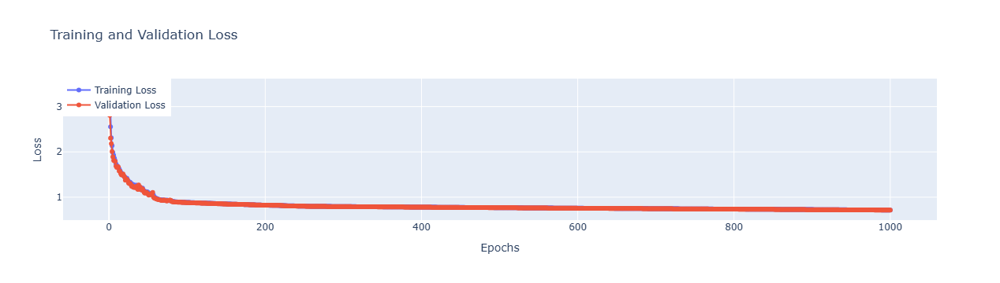

In [4]:
# Plot training and validation loss using Plotly
def plot_training_history(history):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=list(range(1, len(history.history['loss']) + 1)), y=history.history['loss'],
                        mode='lines+markers',
                        name='Training Loss'))
    fig.add_trace(go.Scatter(x=list(range(1, len(history.history['val_loss']) + 1)), y=history.history['val_loss'],
                        mode='lines+markers',
                        name='Validation Loss'))

    fig.update_layout(title='Training and Validation Loss',
                   xaxis_title='Epochs',
                   yaxis_title='Loss',
                   legend=dict(x=0, y=1))
    fig.show()

# Display the training history plot
plot_training_history(history)

In [5]:
# Save the enhanced model
model_save_path = 'I_Hazy_hybrid_unet_rdn_model_with_attention_resnet50'
enhanced_model.save(model_save_path)
print(f"Model saved to {model_save_path} in TensorFlow SavedModel format.")

# Load the saved model with custom loss function
loaded_model = load_model(model_save_path, custom_objects={'combined_resnet_loss': combined_resnet_loss})
print("Model loaded successfully.")

INFO:tensorflow:Assets written to: I_Hazy_hybrid_unet_rdn_model_with_attention_resnet50\assets


INFO:tensorflow:Assets written to: I_Hazy_hybrid_unet_rdn_model_with_attention_resnet50\assets


Model saved to I_Hazy_hybrid_unet_rdn_model_with_attention_resnet50 in TensorFlow SavedModel format.
Model loaded successfully.


Evaluating Model:   0%|                                                                         | 0/30 [00:00<?, ?it/s]

1/1 [==============================] - 1s 804ms/step


Evaluating Model:   3%|██▏                                                              | 1/30 [00:02<01:25,  2.94s/it]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:   7%|████▎                                                            | 2/30 [00:03<00:42,  1.53s/it]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  10%|██████▌                                                          | 3/30 [00:04<00:30,  1.13s/it]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  13%|████████▋                                                        | 4/30 [00:04<00:23,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  17%|██████████▊                                                      | 5/30 [00:05<00:20,  1.22it/s]

1/1 [==============================] - 0s 53ms/step


Evaluating Model:  20%|█████████████                                                    | 6/30 [00:05<00:18,  1.33it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  23%|███████████████▏                                                 | 7/30 [00:06<00:15,  1.45it/s]

1/1 [==============================] - 0s 66ms/step


Evaluating Model:  27%|█████████████████▎                                               | 8/30 [00:07<00:14,  1.51it/s]

1/1 [==============================] - 0s 46ms/step


Evaluating Model:  30%|███████████████████▌                                             | 9/30 [00:07<00:13,  1.54it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  33%|█████████████████████▎                                          | 10/30 [00:08<00:12,  1.58it/s]

1/1 [==============================] - 0s 54ms/step


Evaluating Model:  37%|███████████████████████▍                                        | 11/30 [00:09<00:12,  1.58it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  40%|█████████████████████████▌                                      | 12/30 [00:09<00:11,  1.62it/s]

1/1 [==============================] - 0s 55ms/step


Evaluating Model:  43%|███████████████████████████▋                                    | 13/30 [00:10<00:10,  1.61it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  47%|█████████████████████████████▊                                  | 14/30 [00:10<00:09,  1.60it/s]

1/1 [==============================] - 0s 63ms/step


Evaluating Model:  50%|████████████████████████████████                                | 15/30 [00:11<00:08,  1.67it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  53%|██████████████████████████████████▏                             | 16/30 [00:12<00:08,  1.66it/s]

1/1 [==============================] - 0s 47ms/step


Evaluating Model:  57%|████████████████████████████████████▎                           | 17/30 [00:12<00:07,  1.71it/s]

1/1 [==============================] - 0s 50ms/step


Evaluating Model:  60%|██████████████████████████████████████▍                         | 18/30 [00:13<00:06,  1.73it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  63%|████████████████████████████████████████▌                       | 19/30 [00:13<00:06,  1.78it/s]

1/1 [==============================] - 0s 41ms/step


Evaluating Model:  67%|██████████████████████████████████████████▋                     | 20/30 [00:14<00:05,  1.78it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  70%|████████████████████████████████████████████▊                   | 21/30 [00:14<00:05,  1.76it/s]

1/1 [==============================] - 0s 51ms/step


Evaluating Model:  73%|██████████████████████████████████████████████▉                 | 22/30 [00:15<00:04,  1.80it/s]

1/1 [==============================] - 0s 42ms/step


Evaluating Model:  77%|█████████████████████████████████████████████████               | 23/30 [00:15<00:04,  1.74it/s]

1/1 [==============================] - 0s 43ms/step


Evaluating Model:  80%|███████████████████████████████████████████████████▏            | 24/30 [00:16<00:03,  1.76it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  83%|█████████████████████████████████████████████████████▎          | 25/30 [00:17<00:02,  1.75it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  87%|███████████████████████████████████████████████████████▍        | 26/30 [00:17<00:02,  1.81it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  90%|█████████████████████████████████████████████████████████▌      | 27/30 [00:18<00:01,  1.83it/s]

1/1 [==============================] - 0s 48ms/step


Evaluating Model:  93%|███████████████████████████████████████████████████████████▋    | 28/30 [00:18<00:01,  1.86it/s]

1/1 [==============================] - 0s 49ms/step


Evaluating Model:  97%|█████████████████████████████████████████████████████████████▊  | 29/30 [00:19<00:00,  1.87it/s]

1/1 [==============================] - 0s 45ms/step


Evaluating Model: 100%|████████████████████████████████████████████████████████████████| 30/30 [00:19<00:00,  1.52it/s]


PSNR: 20.1891, SSIM: 0.8391, MSE: 0.011060, CIEDE2000: 8.4506
1/1 [==============================] - 0s 47ms/step


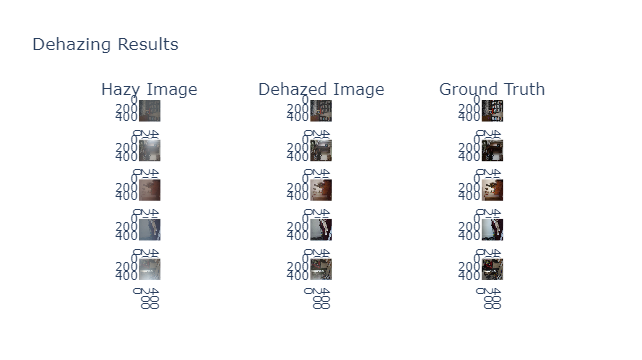

In [6]:
# Function to plot randomly selected dehazed images using Plotly
import plotly.express as px
import plotly.subplots as sp

def plot_random_dehazed_images(model, hazy_img_paths, gt_img_paths=None, num_images=5, target_size=(512, 512)):
    """Plot randomly selected dehazed images alongside their hazy versions and ground truths."""
    selected_indices = random.sample(range(len(hazy_img_paths)), num_images)
    fig = sp.make_subplots(rows=num_images, cols=3, subplot_titles=["Hazy Image", "Dehazed Image", "Ground Truth"])
    
    for i, idx in enumerate(selected_indices):
        # Load and preprocess the hazy image
        hazy_img = Image.open(hazy_img_paths[idx])
        hazy_img = hazy_img.resize(target_size)
        hazy_img = np.array(hazy_img) / 255.0
        hazy_input = np.expand_dims(hazy_img, axis=0)
        
        # Predict the dehazed image
        dehazed_img = model.predict(hazy_input)[0]
        
        # Post-process dehazed output to visualize correctly
        dehazed_img = np.clip(dehazed_img, 0, 1)
        
        # Load the ground truth image if available
        gt_img = None
        if gt_img_paths is not None and len(gt_img_paths) > 0:
            gt_img = Image.open(gt_img_paths[idx])
            gt_img = gt_img.resize(target_size)
            gt_img = np.array(gt_img) / 255.0
        
        # Add images to subplots
        fig.add_trace(px.imshow(hazy_img).data[0], row=i+1, col=1)
        fig.add_trace(px.imshow(dehazed_img).data[0], row=i+1, col=2)
        if gt_img is not None:
            fig.add_trace(px.imshow(gt_img).data[0], row=i+1, col=3)

    fig.update_layout(height=600 * num_images, title_text="Dehazing Results")
    fig.show()

# Evaluate CIEDE2000 Color Difference
def calculate_ciede2000(image1, image2):
    """Calculate the CIEDE2000 color difference between two images."""
    lab1 = color.rgb2lab(image1)
    lab2 = color.rgb2lab(image2)
    ciede2000 = color.deltaE_ciede2000(lab1, lab2)
    return np.mean(ciede2000)

# Evaluate the model
def evaluate_model(model, dataset, win_size=5):
    psnr_values = []
    ssim_values = []
    mse_values = []
    ciede2000_values = []
    
    for X_batch, y_batch in tqdm(dataset, desc="Evaluating Model"):
        y_pred = model.predict(X_batch)
        for true, pred in zip(y_batch, y_pred):
            if isinstance(true, tf.Tensor):
                true = true.numpy()
            if isinstance(pred, tf.Tensor):
                pred = pred.numpy()
            
            true = true.astype(np.float32)
            pred = pred.astype(np.float32)
            
            psnr = tf.image.psnr(true, pred, max_val=1.0).numpy()
            psnr_values.append(psnr)
            
            ssim_index = ssim(true, pred, channel_axis=-1, data_range=1.0, win_size=win_size)
            ssim_values.append(ssim_index)
            
            mse = np.mean((true - pred) ** 2)
            mse_values.append(mse)
            
            ciede2000 = calculate_ciede2000(true, pred)
            ciede2000_values.append(ciede2000)
    
    return (
        np.mean(psnr_values), 
        np.mean(ssim_values), 
        np.mean(mse_values), 
        np.mean(ciede2000_values)
    )

# Evaluate model
psnr, ssim_index, mse, ciede2000 = evaluate_model(loaded_model, i_hazy_dataset, win_size=5)
print(f"PSNR: {psnr:.4f}, SSIM: {ssim_index:.4f}, MSE: {mse:.6f}, CIEDE2000: {ciede2000:.4f}")

# Plot the randomly selected dehazed images
plot_random_dehazed_images(loaded_model, hazy_paths, clear_paths, num_images=5)